In [277]:
using BSON: @save, @load
using Statistics
using MDToolbox, Plots

In [278]:
@load "afm_generate_orientation_data.bson" models afms qs param imodel_array iq_array dxdy_array sigma_noise probe_radius T pi_i T_rot p0_q nframe nq nmodel

In [279]:
#anim = @animate for afm = afms[1:100]
#    heatmap(afm)
#end

#gif(anim, "afm_independent_data.gif", fps = 10)

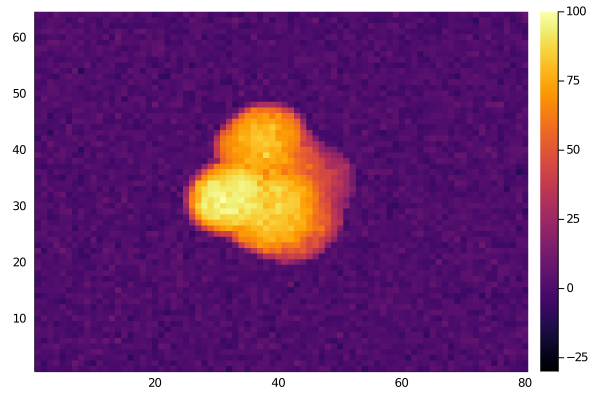

In [280]:
heatmap(afms[30], clims=(-30.0, 100.0))

In [281]:
@load "afm_generate_orientation_data_posterior.bson" r

In [282]:
id = argmax(r.all[1])
id[3]

1

In [283]:
imodel_array_est = []
iq_array_est = []
iparam_array_est = []

for iframe = 1:length(afms)
    id = argmax(r.all[iframe])
    push!(imodel_array_est, id[1])
    push!(iq_array_est, id[2])
    push!(iparam_array_est, id[3])
end

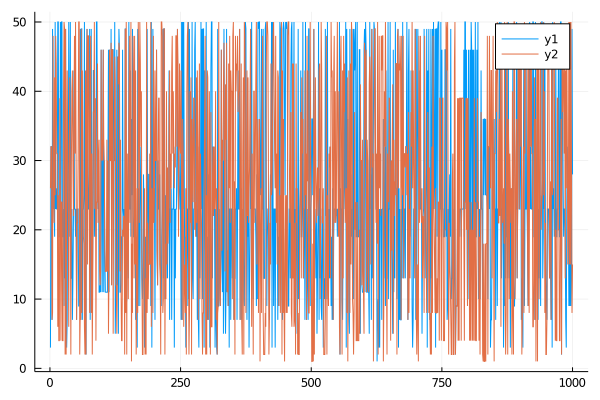

In [284]:
plot(imodel_array_est)
plot!(imodel_array)

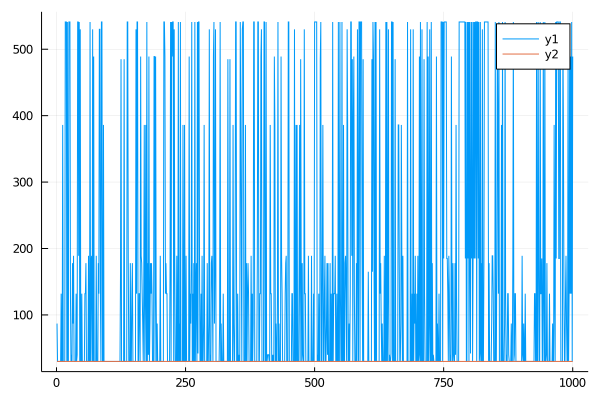

In [285]:
plot(iq_array_est)
plot!(iq_array)

In [286]:
models_true = models[1, :]

for iframe = 1:length(afms)
    imodel = imodel_array[iframe]
    model = models[imodel, :]
    iq = iq_array[iframe]
    q = qs[iq, :]
    MDToolbox.rotate!(model, q)
    models_true = [models_true; model]
end
models_true = models_true[2:end, :]

writepdb("run_true.pdb", models_est)

In [287]:
models_est = models[1, :]

for iframe = 1:length(afms)
    imodel = imodel_array_est[iframe]
    model = models[imodel, :]
    iq = iq_array_est[iframe]
    q = qs[iq, :]
    MDToolbox.rotate!(model, q)
    models_est = [models_est; model]
end
models_est = models_est[2:end, :]

afms_est = []
for iframe = 1:nframe
    model = models_est[iframe, :]
    model.x .= model.x .+ r.dxdy[iframe][1] * 6.25
    model.y .= model.y .+ r.dxdy[iframe][2] * 6.25
    afm = MDToolbox.afmize(model, param)
    push!(afms_est , afm)
end

x = copy(models_est.x)
y = copy(models_est.y)
models_est.x .= y
models_est.y .= x
writepdb("run_est.pdb", models_est)
models_est.x .= x
models_est.y .= y

1000×1044 Array{Float64,2}:
 -17.9043   -14.8176   -11.6687   …   34.461      34.4503    34.8818
 -38.0551   -34.1802   -32.4274       36.6344     34.6383    36.7788
 -38.0551   -34.1802   -32.4274       36.6344     34.6383    36.7788
 -32.313    -34.1583   -32.9223       56.8924     60.6098    63.677
 -30.8763   -33.3635   -33.2009       58.4367     59.7754    62.1412
 -29.5948   -32.8065   -31.7128   …   59.4737     58.749     57.1029
 -29.5556   -32.3663   -32.4038       57.0948     57.3994    55.1475
 -29.5948   -32.8065   -31.7128       59.4737     58.749     57.1029
  34.568     36.3907    34.7557      -44.9189    -47.1331   -50.7866
 -29.3718   -32.8702   -32.5829       42.6144     45.428     46.7891
 -29.5948   -32.8065   -31.7128   …   59.4737     58.749     57.1029
  -4.83997   -6.16989   -7.65732       3.4216      7.31532    7.18302
 -29.5948   -32.8065   -31.7128       59.4737     58.749     57.1029
   ⋮                              ⋱                         
 -29.5948   -3

┌ Info: Saved animation to 
│   fn = /data/yasu/MDToolbox.jl/notebook/run_est.gif
└ @ Plots /opt/julia_depot/packages/Plots/5ItHH/src/animation.jl:104


Plots.AnimatedGif("/data/yasu/MDToolbox.jl/notebook/run_est.gif")
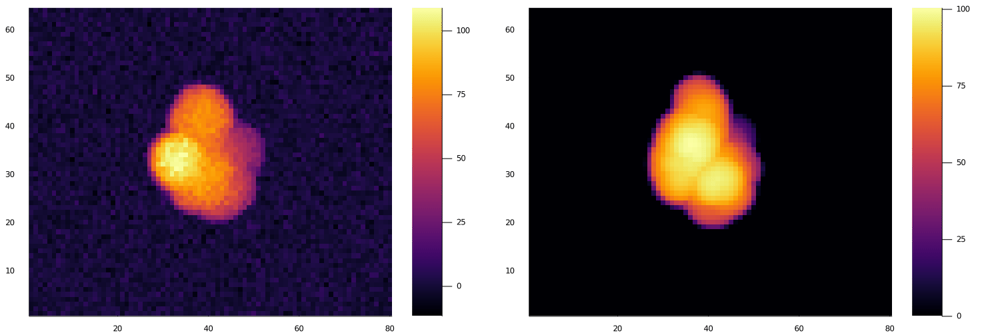

In [288]:
anim = @animate for i in 1:minimum([nframe, 50])
    #heatmap(afms[i], clims=(-950.0, -850.0))
    p1 = heatmap(afms[i])
    p2 = heatmap(afms_est[i])
    plot(p1, p2, size=(1500, 500))
end
gif(anim, "run_est.gif", fps=10)

In [289]:
rmsds = zeros(Float64, length(afms))
rmsds_a = zeros(Float64, length(afms))
rmsds_b = zeros(Float64, length(afms))
rmsds_fitted = zeros(Float64, length(afms))
rmsds_a_fitted = zeros(Float64, length(afms))
rmsds_b_fitted = zeros(Float64, length(afms))


for iframe = 1:length(afms)
    d = compute_rmsd(models_true[iframe, :], models_est[iframe, :])
    rmsds[iframe] = d[1]
    d = compute_rmsd(models_true[iframe, "resid 1:512"], models_est[iframe, "resid 1:512"])
    rmsds_a[iframe] = d[1]
    d = compute_rmsd(models_true[iframe, "resid 513:1044"], models_est[iframe, "resid 513:1044"])
    rmsds_b[iframe] = d[1]

    ta = superimpose(models_true[iframe, :], models_est[iframe, :])
    d = compute_rmsd(models_true[iframe, :], ta)
    rmsds_fitted[iframe] = d[1]
    ta = superimpose(models_true[iframe, "resid 1:512"], models_est[iframe, "resid 1:512"])
    d = compute_rmsd(models_true[iframe, "resid 1:512"], ta)
    rmsds_a_fitted[iframe] = d[1]
    ta = superimpose(models_true[iframe, "resid 513:1044"], models_est[iframe, "resid 513:1044"])
    d = compute_rmsd(models_true[iframe, "resid 513:1044"], ta)
    rmsds_b_fitted[iframe] = d[1]
end

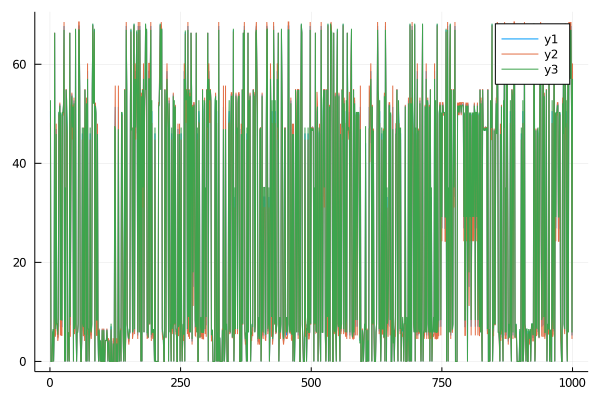

In [290]:
plot(rmsds)
plot!(rmsds_a)
plot!(rmsds_b)

In [291]:
mean(rmsds), std(rmsds)

(26.131042993907506, 24.94717580160329)

In [292]:
mean(rmsds_a), std(rmsds_a)

(25.851290110482744, 25.187017947075443)

In [293]:
mean(rmsds_b), std(rmsds_b)

(26.347117500194315, 24.76788855263585)

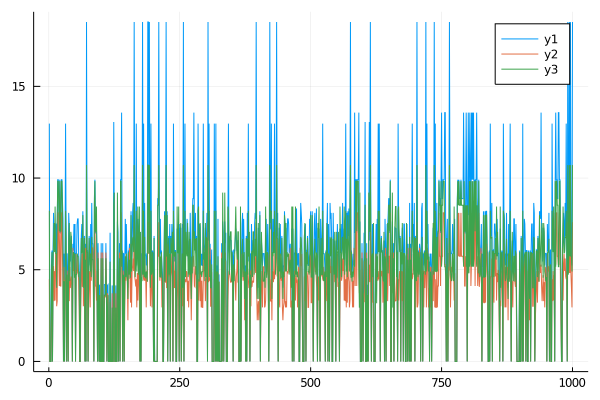

In [294]:
plot(rmsds_fitted)
plot!(rmsds_a_fitted)
plot!(rmsds_b_fitted)

In [295]:
mean(rmsds_fitted), std(rmsds_fitted)

(6.077935256371502, 3.7957480801157963)

In [296]:
mean(rmsds_a_fitted), std(rmsds_a_fitted)

(3.949800697570574, 2.176237137432365)

In [297]:
mean(rmsds_b_fitted), std(rmsds_b_fitted)

(5.118281013613644, 2.859954396511633)

-------------------

In [298]:
posterior = zeros(Float64, nframe, nmodel, nq)

for iframe = 1:length(r.all)
    posterior[iframe, :, :] .= r.all[iframe][:, :, 1]
    p_max = maximum(posterior[iframe, :, :])
    posterior[iframe, :, :] .= exp.(posterior[iframe, :, :] .- p_max)
    posterior[iframe, :, :] .= posterior[iframe, :, :] ./ sum(posterior[iframe, :, :])
end

max_posterior = maximum(posterior, dims=1)[1, :, :]
id = findall(max_posterior .> 1e-500)
id_size = length(id)

1494

In [299]:
id

1494-element Array{CartesianIndex{2},1}:
 CartesianIndex(6, 6)
 CartesianIndex(9, 6)
 CartesianIndex(19, 6)
 CartesianIndex(21, 6)
 CartesianIndex(22, 6)
 CartesianIndex(23, 6)
 CartesianIndex(40, 6)
 CartesianIndex(43, 6)
 CartesianIndex(15, 14)
 CartesianIndex(15, 16)
 CartesianIndex(39, 16)
 CartesianIndex(49, 16)
 CartesianIndex(10, 17)
 ⋮
 CartesianIndex(43, 566)
 CartesianIndex(49, 566)
 CartesianIndex(19, 567)
 CartesianIndex(21, 567)
 CartesianIndex(23, 567)
 CartesianIndex(31, 567)
 CartesianIndex(36, 567)
 CartesianIndex(37, 567)
 CartesianIndex(39, 567)
 CartesianIndex(40, 567)
 CartesianIndex(42, 567)
 CartesianIndex(48, 567)

In [300]:
T_mix = zeros(Float64, id_size, id_size)

for i = 1:id_size
    for j = 1:id_size
        if T_rot[id[i][2], id[j][2]] < 0.000001
            continue
        end
        T_mix[i, j] = T[id[i][1], id[j][1]]
    end
    T_mix[i, :] .= T_mix[i, :] / sum(T_mix[i, :])
end

emission = zeros(Float64, id_size, nframe)
for iframe = 1:nframe
    for i = 1:id_size
        p = posterior[iframe, :, :]
        emission[i, iframe] = p[id[i]] + 1e-5
    end
end

pi_mix = ones(id_size) ./ id_size;

In [301]:
id_array_est = msmviterbi(collect(1:nframe), T_mix, pi_mix, emission)

1000-element Array{Int64,1}:
 52
 77
 77
 53
 91
 69
 72
 69
 48
 92
 69
 80
 69
  ⋮
 69
 77
 48
 69
 64
 47
 47
 47
 47
 47
 91
 48

In [302]:
imodel_array_est = zeros(Int64, nframe)
iq_array_est = zeros(Int64, nframe)

for iframe = 1:nframe
    imodel_array_est[iframe] = id[id_array_est[iframe]][1]
    iq_array_est[iframe] = id[id_array_est[iframe]][2]
end

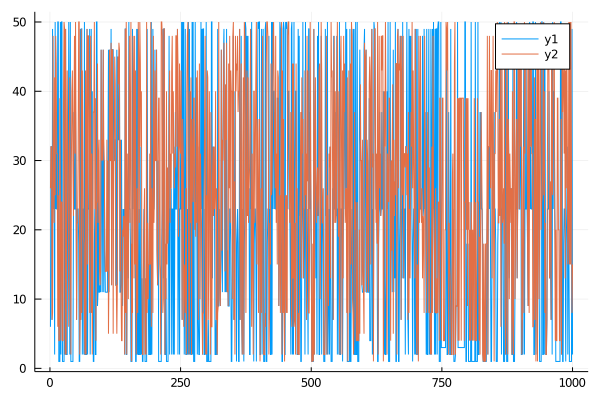

In [303]:
plot(imodel_array_est)
plot!(imodel_array)

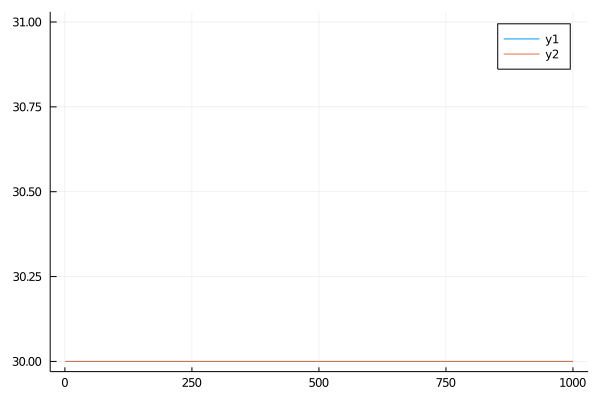

In [304]:
plot(iq_array_est)
plot!(iq_array)

In [305]:
models_est = models[1, :]

for iframe = 1:nframe
    imodel = imodel_array_est[iframe]
    model = models[imodel, :]
    iq = iq_array_est[iframe]
    q = qs[iq, :]
    MDToolbox.rotate!(model, q)
    models_est = [models_est; model]
end
models_est = models_est[2:end, :]

afms_est = []
for iframe = 1:nframe
    model = models_est[iframe, :]
    model.x .= model.x .+ r.dxdy[iframe][1] * 6.25
    model.y .= model.y .+ r.dxdy[iframe][2] * 6.25
    afm = MDToolbox.afmize(model, param)
    push!(afms_est , afm)
end

x = copy(models_est.x)
y = copy(models_est.y)
models_est.x .= y
models_est.y .= x
writepdb("run_est2.pdb", models_est)
models_est.x .= x
models_est.y .= y

1000×1044 Array{Float64,2}:
 -28.1857  -31.1431  -31.9722  …  29.3594  29.028   28.9137  25.9014
 -38.0551  -34.1802  -32.4274     34.2474  36.6344  34.6383  36.7788
 -38.0551  -34.1802  -32.4274     34.2474  36.6344  34.6383  36.7788
 -32.313   -34.1583  -32.9223     54.8119  56.8924  60.6098  63.677
 -30.8763  -33.3635  -33.2009     56.076   58.4367  59.7754  62.1412
 -29.5948  -32.8065  -31.7128  …  55.72    59.4737  58.749   57.1029
 -29.5556  -32.3663  -32.4038     54.5224  57.0948  57.3994  55.1475
 -29.5948  -32.8065  -31.7128     55.72    59.4737  58.749   57.1029
 -34.0462  -35.7811  -33.7457     41.2676  40.6625  39.5359  42.8037
 -29.3718  -32.8702  -32.5829     43.6549  42.6144  45.428   46.7891
 -29.5948  -32.8065  -31.7128  …  55.72    59.4737  58.749   57.1029
 -37.7641  -34.5152  -32.5466     50.6827  48.0134  50.5908  53.4102
 -29.5948  -32.8065  -31.7128     55.72    59.4737  58.749   57.1029
   ⋮                           ⋱   ⋮                         
 -29.5948  -32

┌ Info: Saved animation to 
│   fn = /data/yasu/MDToolbox.jl/notebook/run_est2.gif
└ @ Plots /opt/julia_depot/packages/Plots/5ItHH/src/animation.jl:104


Plots.AnimatedGif("/data/yasu/MDToolbox.jl/notebook/run_est2.gif")
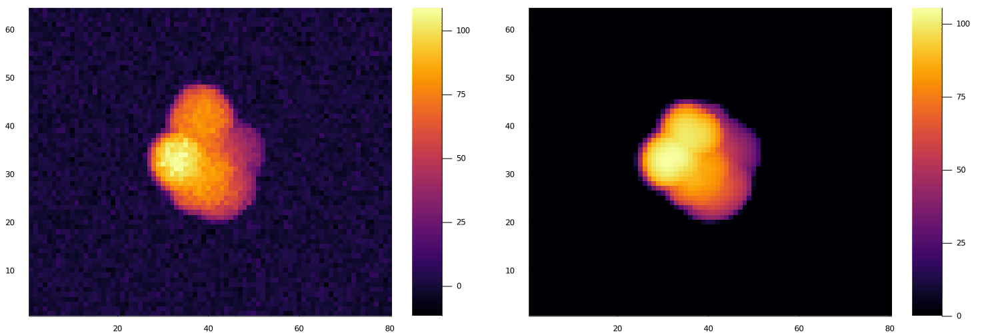

In [306]:
anim = @animate for i in 1:minimum([nframe, 50])
    #heatmap(afms[i], clims=(-950.0, -850.0))
    #heatmap(afms_est[i])
    p1 = heatmap(afms[i])
    p2 = heatmap(afms_est[i])
    plot(p1, p2, size=(1500, 500))
end
gif(anim, "run_est2.gif", fps=10)

In [307]:
rmsds2 = zeros(Float64, length(afms))
rmsds2_a = zeros(Float64, length(afms))
rmsds2_b = zeros(Float64, length(afms))
rmsds2_fitted = zeros(Float64, length(afms))
rmsds2_a_fitted = zeros(Float64, length(afms))
rmsds2_b_fitted = zeros(Float64, length(afms))


for iframe = 1:length(afms)
    d = compute_rmsd(models_true[iframe, :], models_est[iframe, :])
    rmsds2[iframe] = d[1]
    d = compute_rmsd(models_true[iframe, "resid 1:512"], models_est[iframe, "resid 1:512"])
    rmsds2_a[iframe] = d[1]
    d = compute_rmsd(models_true[iframe, "resid 513:1044"], models_est[iframe, "resid 513:1044"])
    rmsds2_b[iframe] = d[1]

    ta = superimpose(models_true[iframe, :], models_est[iframe, :])
    d = compute_rmsd(models_true[iframe, :], ta)
    rmsds2_fitted[iframe] = d[1]
    ta = superimpose(models_true[iframe, "resid 1:512"], models_est[iframe, "resid 1:512"])
    d = compute_rmsd(models_true[iframe, "resid 1:512"], ta)
    rmsds2_a_fitted[iframe] = d[1]
    ta = superimpose(models_true[iframe, "resid 513:1044"], models_est[iframe, "resid 513:1044"])
    d = compute_rmsd(models_true[iframe, "resid 513:1044"], ta)
    rmsds2_b_fitted[iframe] = d[1]
end

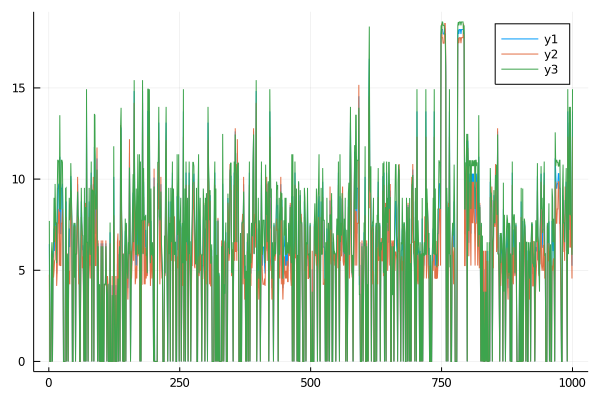

In [308]:
plot(rmsds2)
plot!(rmsds2_a)
plot!(rmsds2_b)

In [309]:
mean(rmsds2), std(rmsds2)

(5.906915331288288, 4.04686428342285)

In [310]:
mean(rmsds2_a), std(rmsds2_a)

(5.333144857283951, 3.8206743431107384)

In [311]:
mean(rmsds2_b), std(rmsds2_b)

(6.351533094152312, 4.341309042786884)

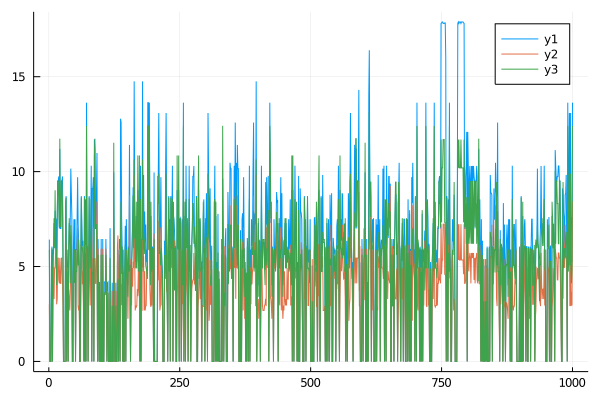

In [312]:
plot(rmsds2_fitted)
plot!(rmsds2_a_fitted)
plot!(rmsds2_b_fitted)

In [313]:
mean(rmsds2_fitted), std(rmsds2_fitted)

(5.885740498719885, 4.019062530472406)

In [314]:
mean(rmsds2_a_fitted), std(rmsds2_a_fitted)

(3.6386881620527793, 2.3705054873409908)

In [315]:
mean(rmsds2_b_fitted), std(rmsds2_b_fitted)

(4.941034352807275, 3.230281212147408)

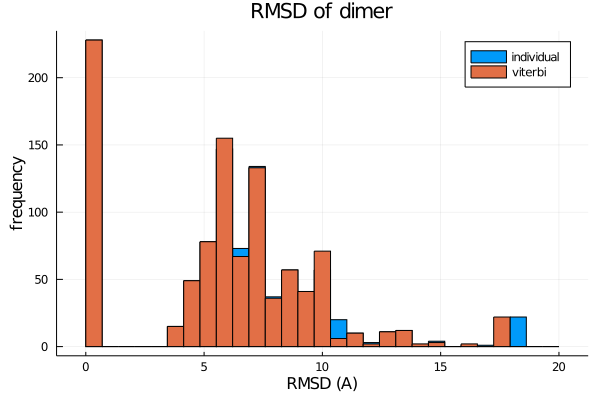

In [348]:
histogram(rmsds2, bins=range(0.0, stop=maximum(20.0), length=30), label="individual")
histogram!(rmsds2_fitted, bins=range(0.0, stop=maximum(20.0), length=30), label="viterbi")
xlabel!("RMSD (A)")
ylabel!("frequency")
title!("RMSD of dimer")

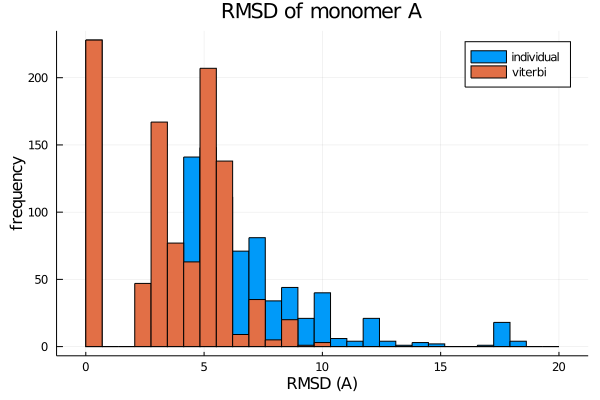

In [349]:
histogram(rmsds2_a, bins=range(0.0, stop=maximum(20.0), length=30), label="individual")
histogram!(rmsds2_a_fitted, bins=range(0.0, stop=maximum(20.0), length=30), label="viterbi")
xlabel!("RMSD (A)")
ylabel!("frequency")
title!("RMSD of monomer A")

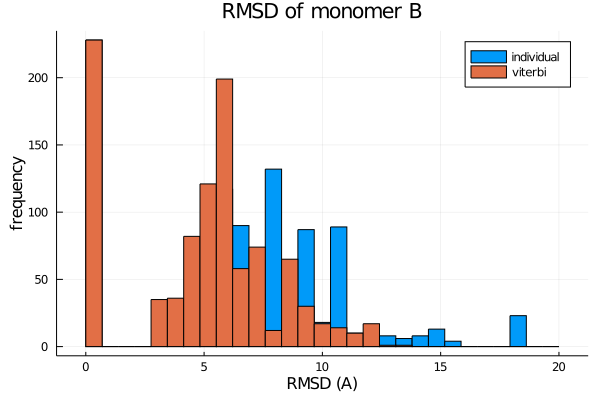

In [350]:
histogram(rmsds2_b, bins=range(0.0, stop=maximum(20.0), length=30), label="individual")
histogram!(rmsds2_b_fitted, bins=range(0.0, stop=maximum(20.0), length=30), label="viterbi")
xlabel!("RMSD (A)")
ylabel!("frequency")
title!("RMSD of monomer B")